In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import uniform

# Distribution Function

## Plummer potential in natural unit: 
The gravitational potential is defined as
$$
\phi(r,b) = -\frac{1}{\sqrt{r^2 + b^2}}
$$

and the corrected potential is

$$
\psi(r,b) = -\phi(r,b) + \phi_0
$$
we arbitrary chose to set b=1. 

In [2]:
def psi(r,b,phi0=0):
    phi=-1/np.sqrt(r**2+b**2)
    return -phi+phi0

### Rejection Sampling
To implement Montecarlo Rejection Sampling we define a new variable q to perform integration as
$$
q = \frac{v}{v_e},
$$
where $v_e$ is the escape velocity defined from potential 
$$
v_e(r) = \sqrt{2 |\psi(r)|}
$$

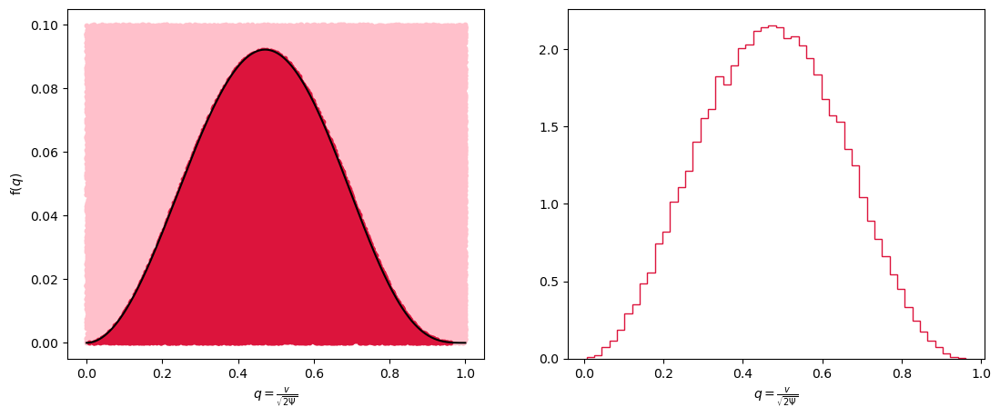

In [3]:
f = lambda x: (1-x**2)**(7/2)*x**2

n_rs=100000 #number of particles

xg = np.linspace(0,1,n_rs)
fig, ax = plt.subplots(1,2,figsize=(13,5))
ax[0].plot(xg,f(xg),c='k')


ymax = 0.1
x = np.random.uniform(0,1,n_rs) 
y = np.random.uniform(0,ymax,n_rs)


ax[0].scatter(x[y>f(x)],y[y>f(x)],c='pink',s=10)
ax[0].scatter(x[y<f(x)],y[y<f(x)],c='crimson',s=10)

ax[0].set_xlabel(r'$q=\frac{v} { \sqrt{2 \Psi} }$')
ax[0].set_ylabel('f$(q)$')

#plt.show()
goodpoints = x[y<f(x)]


ax[1].hist(goodpoints,bins=50,density=True,histtype='step',color='crimson')
ax[1].set_xlabel(r'$q=\frac{v} { \sqrt{2 \Psi} }$');

# Plummer Sphere

This is a case for a spherical symmetric system (used to described elliptical galaxy and dark matter haloes). The mass can be expressed as: 

$$
M(r)=4 \pi \int^r_0 r'^2 \rho (r') dr' 
$$

$$
M(r)=M_{tot} \frac{r^3}{b^3(1+r^2/b^2)^{\frac{3}{2}}}
$$
Also we have an expression for the density:
$$
\rho(r) = \frac{3M_{tot}}{4\pi b^3}\left(1 + \frac{r^2}{b^2}\right)^{-5/2}
$$

## Initial Conditions

In [4]:
def generate_treecode_ic(filename, N=10000, b=1.0): #N set for the numer of particle while b is arbitrary set to 1 
    
    masses = np.ones(N)/N #total mass 1

    phi = np.random.uniform(0, 2*np.pi, N)
    costheta = np.random.uniform(-1, 1, N)
    u = np.random.uniform(0, 1, N)
    
    theta = np.arccos(costheta)
    r=np.sqrt(b**2*u**(2/3)/(1-u**(2/3)))

    x = r*np.sin(theta)*np.cos(phi)
    y = r*np.sin(theta)*np.sin(phi)
    z = r*np.cos(theta)

    f = lambda q: (1-q**2)**(7/2)*q**2

    ymax = 0.1
    q=np.array([])

    while len(q)<N:
        x_rej = np.random.uniform(0,1,1)
        y_rej = np.random.uniform(0,ymax,1)
    
        if y_rej<f(x_rej):
            q=np.append(q,x_rej)

    #q=1 #q must be sampled with rejection sampling
    v = q*np.sqrt(2*psi(r,b))

    phi = np.random.uniform(0, 2*np.pi, N)
    costheta = np.random.uniform(-1, 1, N)    
    theta = np.arccos(costheta)
    
    vx = v*np.sin(theta)*np.cos(phi)
    vy = v*np.sin(theta)*np.sin(phi)
    vz = v*np.cos(theta)

    with open(filename, 'w') as f:
        f.write(f"{N}\n")         # Nport
        f.write("3\n")            # N of dimensions
        f.write("0.0\n")          # time
        
        # Array of masses
        for m in masses:
            f.write(f"{m:.8e}\n")
            
        # Array of positions
        for i in range(N):
            f.write(f"{x[i]:.8e} {y[i]:.8e} {z[i]:.8e}\n")
            
        # Array of velocities
        for i in range(N):
            f.write(f"{vx[i]:.8e} {vy[i]:.8e} {vz[i]:.8e}\n")

    return x,y,z, vx,vy,vz

In [5]:
filename='IC_Plummer.txt'
n=10000
xin,yin,zin, vxin,vyin,vzin=generate_treecode_ic(filename, N=10000)

## Visualization of Initial Conditions

### Virial radius

The virial radius $( r_{\mathrm{vir}} $) is commonly defined as the radius within which the system satisfies the virial equilibrium condition. A frequently used expression (in terms of total mass ($M_{tot}$) and gravitational potential energy ($\phi$)) is:

$$
r_{\mathrm{vir}} = -\frac{G M^2}{2\phi}
$$

where:
- G  is the gravitational constant  
- M is the total mass of the system  
- $\phi$  is the total gravitational potential energy (negative for bound systems)

Substituting the expression for $\phi$ we get that 

$$
r_{\mathrm{vir}} \approx 0.455
$$

Setting $ b = 1 $ and $ M_{\mathrm{tot}} = 1 $, the density becomes

$$
\rho(r) = \frac{3}{4\pi}\left(1 + r^2\right)^{-5/2}
$$

In [131]:
def rho_min(rs,r):
    return 1e-4*len(rs[rs<r])/(4/3 * np.pi * r**3), 1e-4*len(rs[rs<r])
    
r_in = np.sqrt(xin**2+yin**2+zin**2)
rho_in = (rho_min(r_in, 0.05))[0]
m_in = (rho_min(r_in, 0.05))[1]

(m_in/rho_in)**(1/3)



0.08059959770082349

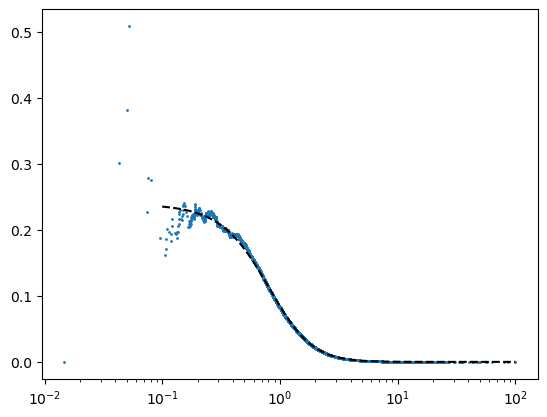

In [142]:
y=[]
for xi in r_in: y = np.append(y,(rho_min(r_in, xi))[0])
plt.scatter(r_in,y,s=1)
x = np.logspace(-1,2,100)
plt.plot(x,3/(4*np.pi)*(1+(x)**2)**(-3/2), color='k', linestyle='--')

plt.xscale('log')
#plt.yscale('log')


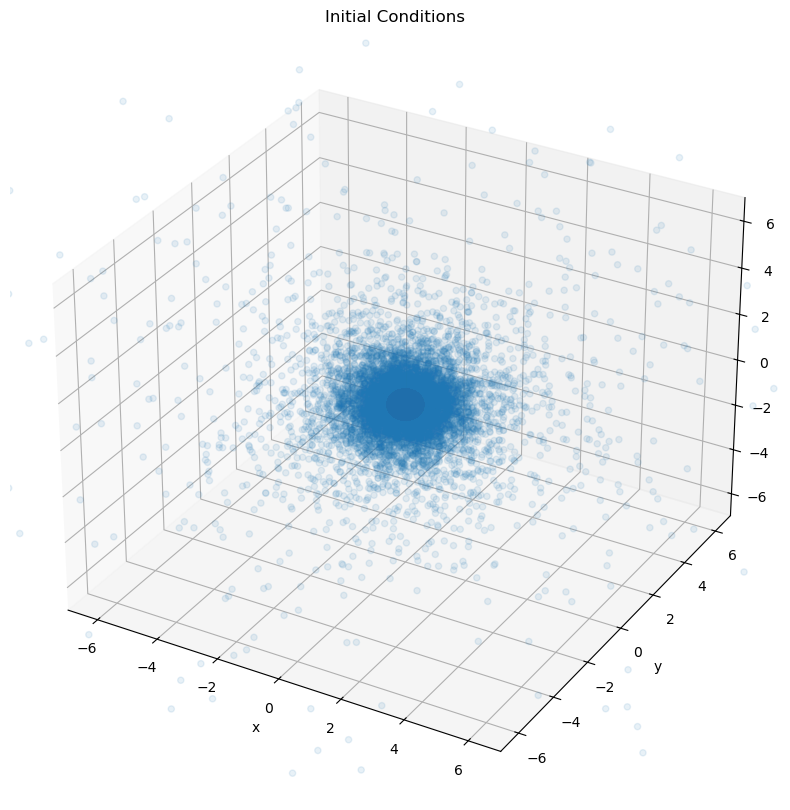

In [6]:
fig = plt.figure(figsize=[10,10])
ax = fig.add_subplot(projection='3d')
#ax.scatter(xin,yin,zin, alpha=0.1, s=5)
ax.set_title("Initial Conditions")
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim(-7,7)
ax.set_ylim(-7,7)
ax.set_zlim(-7,7)

mean_virial_radius_in=0.455
theta_vir = np.linspace(0, np.pi, 100)      
phi_vir = np.linspace(0, 2*np.pi, 100)     

theta_vir, phi_vir = np.meshgrid(theta_vir, phi_vir)

x_vir = mean_virial_radius_in * np.sin(theta_vir) * np.cos(phi_vir)
y_vir = mean_virial_radius_in * np.sin(theta_vir) * np.sin(phi_vir)
z_vir = mean_virial_radius_in * np.cos(theta_vir)

#different way to do the same things
#ax.plot_surface(x_vir, y_vir, z_vir, color='black')
#ax.plot_wireframe(x_vir, y_vir, z_vir,color='black',linewidth=0.5,rstride=3,cstride=3)
#ax.plot_trisurf(x_vir.flatten(),y_vir.flatten(),z_vir.flatten(),color='red',alpha=1)

ax.scatter(xin,yin,zin, alpha=0.1)
ax.scatter(x_vir, y_vir, z_vir, color='red',alpha=1, s=10)
plt.show()

In [7]:
r_in = (xin**2 + yin**2 + zin**2)**0.5
psi_in = psi(r_in, 1, phi0=0)

### Initial Positions

41.120000000000005 % of the mass is inside a radius of 1.3


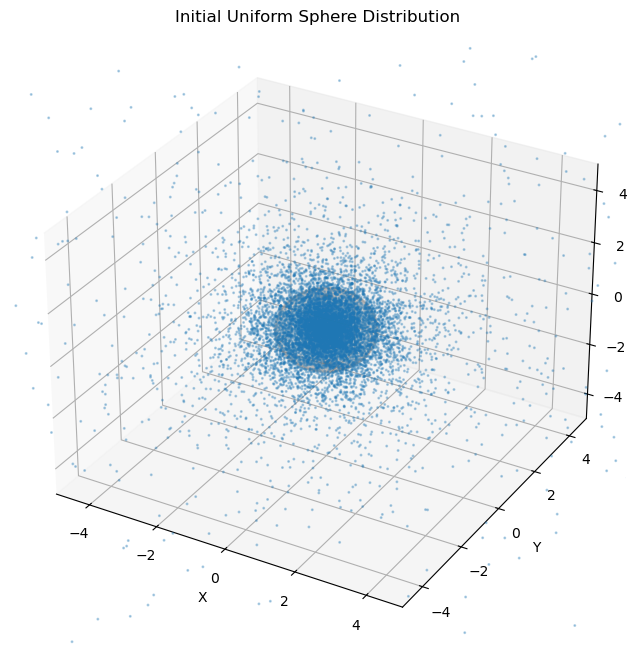

In [8]:
from mpl_toolkits.mplot3d import Axes3D # Required for 3D plots

def visualize_sphere_distribution(x,y,z, R, title="Initial Uniform Sphere Distribution"):
    """
    Visualizes the 3D distribution of particles in a sphere.

    Parameters:
        positions: Nx3 NumPy array of particle positions (x, y, z)
        R: The nominal radius of the sphere
        title: Title for the plot
    """
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot particles
    ax.scatter(x, y, z, s=5, alpha=0.3, marker='.')

    # Plot a wireframe sphere for reference
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x_sphere = R * np.outer(np.cos(u), np.sin(v))
    y_sphere = R * np.outer(np.sin(u), np.sin(v))
    z_sphere = R * np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_wireframe(x_sphere, y_sphere, z_sphere, color='gray', alpha=0.1)

    r=x**2+y**2+z**2
    #r_sphere=x_sphere**2+y_sphere**2+z_sphere**2
    print(np.sum(r<R)/n*100, "% of the mass is inside a radius of", R)

    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)

    # Set equal aspect ratio
    # This ensures the sphere doesn't look squashed
    max_range = np.array([x.max()-x.min(),
                          y.max()-y.min(),
                          z.max()-z.min()]).max() / 2.0

    mid_x = (x.max()+x.min()) * 0.5
    mid_y = (y.max()+y.min()) * 0.5
    mid_z = (z.max()+z.min()) * 0.5
   
    #ax.set_xlim(mid_x - max_range, mid_x + max_range)
    #ax.set_ylim(mid_y - max_range, mid_y + max_range)
    #ax.set_zlim(mid_z - max_range, mid_z + max_range)

    ax.set_xlim(-5,5)
    ax.set_ylim(-5,5)
    ax.set_zlim(-5,5)

    plt.show()


visualize_sphere_distribution(xin,yin,zin,1.3)

### Initial Velocities

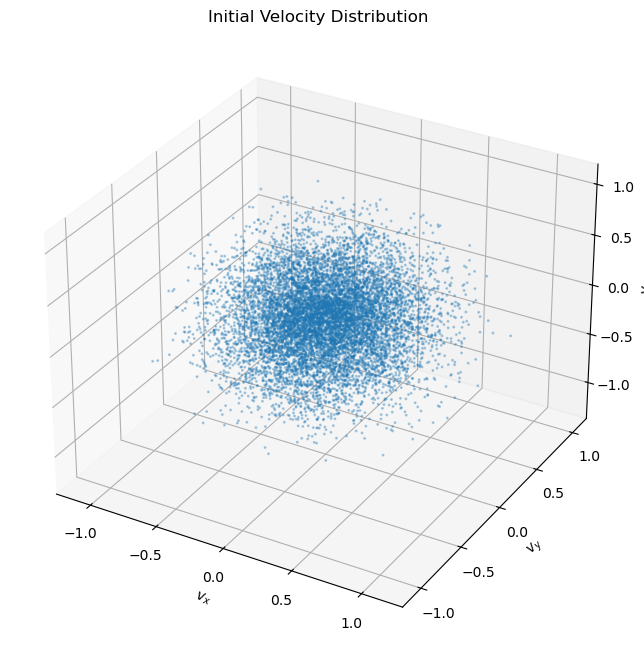

In [9]:
fig = plt.figure(figsize=[10,8])
ax = fig.add_subplot(projection='3d')
ax.scatter(vxin,vyin,vzin, s=5, alpha=0.3, marker='.')

ax.set_title("Initial Velocity Distribution")
ax.set_xlabel(r'$v_x$')
ax.set_ylabel(r'$v_y$')
ax.set_zlabel(r'$v_z$')

plt.show()

### Initial Positions and Velocities

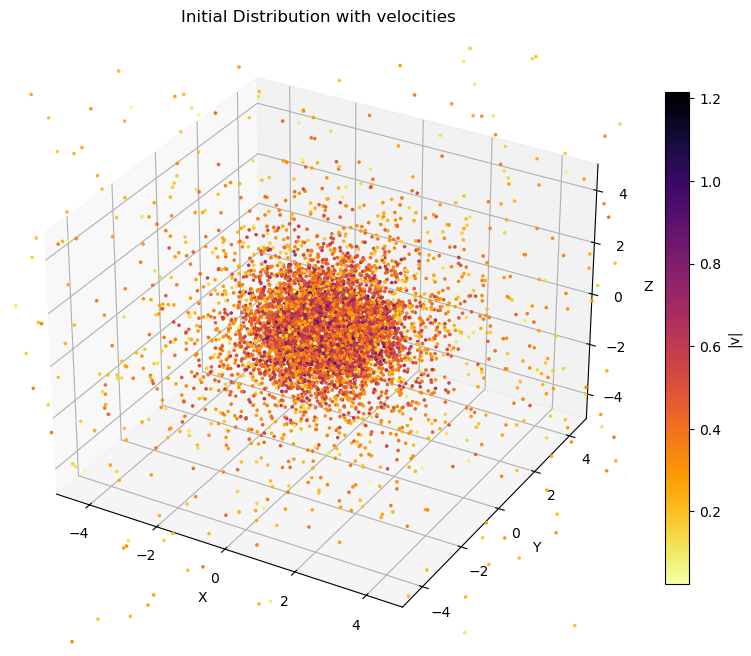

In [55]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot particles
color = np.sqrt(vxin**2+vyin**2+vzin**2)
pos = ax.scatter(xin, yin, zin, s=10, alpha=1, marker='.', c=color, cmap='inferno_r' )
fig.colorbar(pos, label='|v|',shrink=0.8)

# Set labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Set equal aspect ratio
# This ensures the sphere doesn't look squashed

ax.set_xlim(-5,5)
ax.set_ylim(-5,5)
ax.set_zlim(-5,5)
ax.set_title('Initial Distribution with velocities')

plt.show()


### Distribution of initial circular velocity

In [11]:
from galpy import potential
pp = potential.PlummerPotential(amp=1.,b=1.)
vc_pot = potential.calcRotcurve(pp,np.linspace(2e-2,2e2,1000))

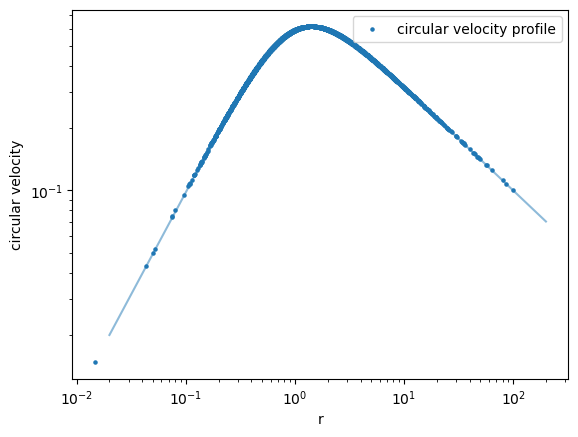

In [12]:
def circular_velocity(radius):
    return np.sqrt((radius**2)/(1+radius**2)**(3/2))
plt.scatter(r_in, circular_velocity(r_in), label="circular velocity profile", s=5)
plt.plot(np.linspace(2e-2,2e2,1000), vc_pot,alpha=0.5)
#plt.scatter(r_in, v_esc, label="escape velocity profile", s=5)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('r')
plt.ylabel('circular velocity')
plt.legend()

In [13]:
v_esc = potential.calcEscapecurve(pp,r_in)

# Results Analysis

### Loading Data

In [14]:
def load_all_snapshots(filename, N=10000):
    snapshots = []
    
    with open(filename, 'r') as f:
        # Leggiamo tutto e puliamo da righe vuote
        lines = [l.strip() for l in f.readlines() if l.strip()]
    
    i = 0
    total_lines = len(lines)
    
    # Uno snapshot completo occupa: 4 (header) + N (masse) + N (posizioni) + N (velocità)
    lines_per_snapshot = 3 + 3 * N
    
    #print(f"Righe totali nel file: {total_lines}")
    
    while i + lines_per_snapshot <= total_lines:
        try:
            # Header
            n_part = float(lines[i])
            # Se n_part non è quello atteso, il file è corrotto o diverso
            if n_part != N:
                print(f"Attenzione: trovato N={n_part} alla riga {i}, atteso {N}")
                i += 1
                continue
                
            t_now = float(lines[i+2])
            
            # Indici dei blocchi
            m_start = i + 3
            p_start = m_start + N
            v_start = p_start + N
            
            # Caricamento dati con conversione veloce
            # Masse
            m = np.array(lines[m_start : p_start], dtype=float)
            
            # Posizioni (ogni riga ha 3 numeri separati da spazio)
            pos = np.array([l.split() for l in lines[p_start : v_start]], dtype=float)
            
            # Velocità
            vel = np.array([l.split() for l in lines[v_start : v_start + N]], dtype=float)
            
            snapshots.append({
                'time': t_now,
                'm': m,
                'pos': pos,
                'vel': vel
            })
            
            #print(f"Caricato snapshot al tempo t = {t_now}")
            
            # Vai all'inizio del prossimo snapshot
            i += lines_per_snapshot
            
        except Exception as e:
            print(f"Errore alla riga {i}: {e}")
            i += 1
            
    if not snapshots:
        print("❌ Nessuno snapshot salvato. Verifica che N sia corretto (nel file leggo 10000).")
    else:
        print(f"✅ Totale snapshot caricati: {len(snapshots)}")
        
    return snapshots

In [15]:
output_path = 'out2.txt'

In [16]:
frames  = load_all_snapshots(output_path, 10000)
print(f"Successfully parsed {len(frames)} snapshots.")

✅ Totale snapshot caricati: 41
Successfully parsed 41 snapshots.


### Final Positions

In [17]:
xfin = frames[-1]['pos'][:,0]
yfin = frames[-1]['pos'][:,1]
zfin = frames[-1]['pos'][:,2]

42.16 % of the mass is inside a radius of 1.3


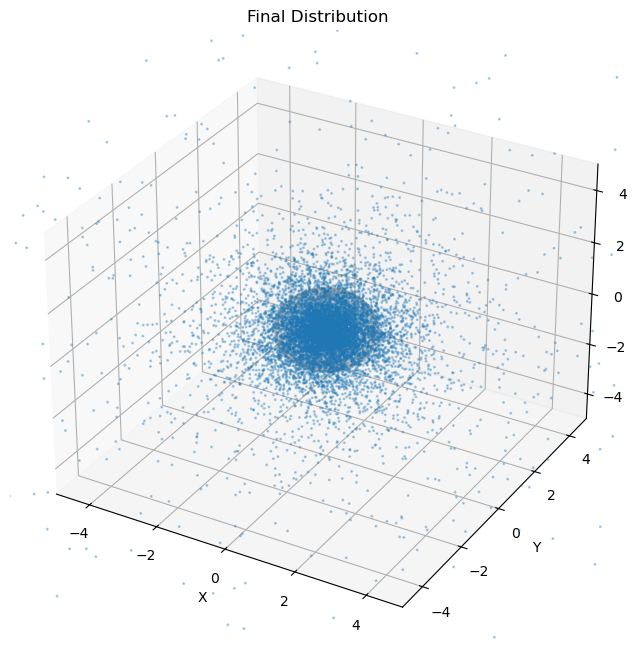

In [18]:
visualize_sphere_distribution(xfin,yfin,zfin,1.3,title='Final Distribution')

### Lagrangian Radii

In [19]:
def find_density_center(pos, m, factor=0.9, tol=1e-5, min_particles=100):
    """Trova il centro di densità restringendo iterativamente la sfera."""
    # Punto di partenza: CM classico
    current_cm = np.sum(pos * m[:, np.newaxis], axis=0) / np.sum(m)
    distances = np.linalg.norm(pos - current_cm, axis=1)
    current_r = np.max(distances)
    diff = 1e10
    while diff > tol and len(pos) > min_particles:
        old_cm = current_cm.copy()
        current_r *= factor
        
        distances = np.linalg.norm(pos - current_cm, axis=1)
        mask = distances < current_r
        
        if np.sum(mask) < min_particles:
            break
            
        pos_subset = pos[mask]
        m_subset = m[mask]
        current_cm = np.sum(pos_subset * m_subset[:, np.newaxis], axis=0) / np.sum(m_subset)
        diff = np.linalg.norm(current_cm - old_cm)
    
    return current_cm

def plot_collapse_diagnostics_allsphere(snapshots):
    times = []
    rr = [] # Qui memorizziamo i raggi delle shell
    
    # Definiamo le frazioni di massa (10%, 20% ... 100%)
    fractions = np.linspace(0.1, 0.9, 9)
    
    print("Calcolo raggi lagrangiani con Shrinking Sphere...")
    
    for snap in snapshots:
        t = snap['time']
        pos = snap['pos']
        m = snap['m']
        
        # --- SHRINKING SPHERE ---
        
        center = find_density_center(pos, m)
        
       
        distances = np.linalg.norm(pos - center, axis=1)
        distances = np.sort(distances)
        # ----------------------------------------------
        
        times.append(t)
        
        current_shells = []
        for per in fractions:
            idx = int(per * (len(distances) - 1))
            current_shells.append(distances[idx])
        rr.append(current_shells)
    
    rr_array = np.array(rr).T
    
  
    plt.figure(figsize=(10, 7))
    
    for i, shell_data in enumerate(rr_array):
        label = f'{int(fractions[i]*100)}% Mass'
        color = plt.cm.viridis(i / len(rr_array))
        plt.plot(times, shell_data, label=label, color=color, lw=1.5, alpha=0.8,linestyle='--')
        #plt.scatter(times, shell_data, label=label, color=color, lw=1.5, alpha=0.8,marker='.',s=10)
    # Marcatori Fisici
    plt.axhline(y=1.0, color='gray', linestyle=':', alpha=0.5, label='b')
    plt.axhline(y=0.5, color='gray', linestyle=':', alpha=0.5, label='b/2')

    plt.title("Lagrangian radii evolution")
    plt.xlabel("Time [IU]")
    plt.ylabel("Radius [IU]")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    #plt.yscale('log')
    plt.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()


In [20]:
def plot_collapse_diagnostics_allsphere(snapshots):
    times = []
    # We will store the results in a 2D array: (Number of Snapshots, 10 Shells)
    rr = []
    
    # Define the mass fractions we want to track
    fractions = np.linspace(0.1, 0.9, 9) # 10%, 20% ... 90%
    
    for snap in snapshots:
        t = snap['time']
        pos = snap['pos']
        
        # Center the data to remove numerical drift
        center = np.mean(pos, axis=0)
        #print(center)
        distances = np.sort(np.linalg.norm(pos - center, axis=1))
        
        times.append(t)
        
        # Calculate radius for each mass fraction
        current_shells = []
        for per in fractions:
            idx = int(per * (len(distances) - 1))
            current_shells.append(distances[idx])
        rr.append(current_shells)
    
    # Convert to array and transpose so each row is a time-series for a shell
    rr_array = np.array(rr).T
    
    plt.figure(figsize=(10, 7))
    
    # Plot each shell
    for i, shell_data in enumerate(rr_array):
        label = f'{int(fractions[i]*100)}% Mass'
        # Use a colormap to make it look professional
        color = plt.cm.viridis(i / len(rr_array))
        plt.plot(times, shell_data, label=label, color=color, lw=1.5, alpha=0.8)
    
    # Physics markers
    plt.axhline(y=1.0, color='b', linestyle=':', alpha=0.5, label='b')
    plt.axhline(y=0.5, color='gray', linestyle=':', alpha=0.5, label='b/2')

    plt.title("Evolution of Lagrangian Radii (Mass Shells)")
    plt.xlabel("Time")
    plt.ylabel("Radius")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()

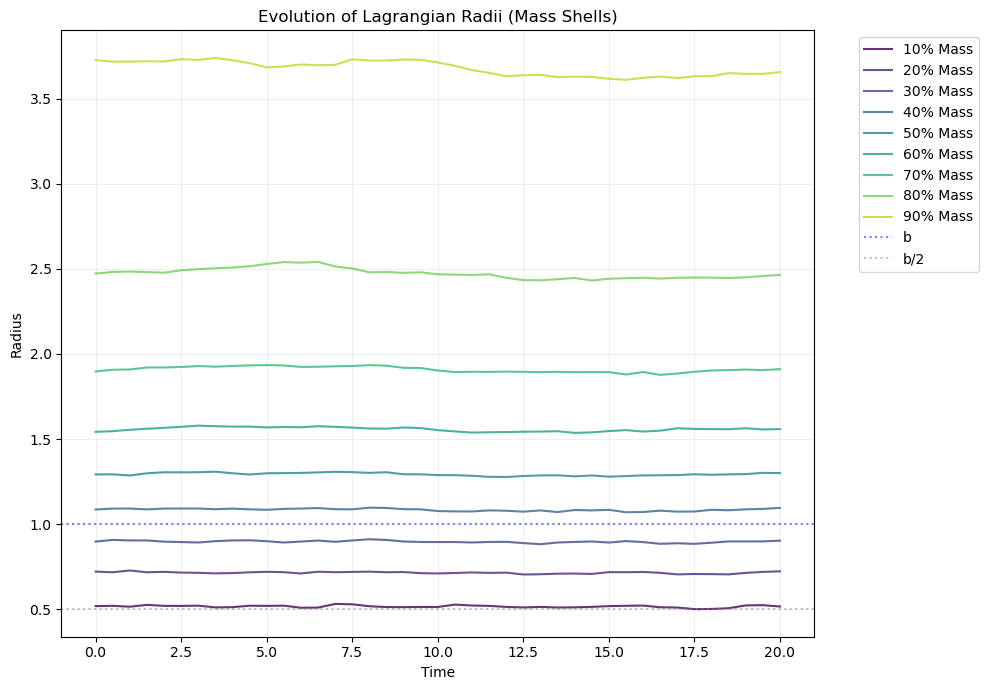

In [21]:
plot_collapse_diagnostics_allsphere(frames) 

### Bound vs Unbound Particles

In [57]:
def compute_potential(pos, m, G=1.0, epsilon=0.05): #siamo sicuri del softening?
    """
    Calcola il potenziale gravitazionale per ogni particella.
    epsilon è il 'softening parameter' per evitare divergenze.
    """
    num_particles = len(m)
    phi = np.zeros(num_particles)
    
    # Questo è un calcolo O(N^2), vettorizzato per velocità
    for i in range(num_particles):
        dx = pos[:, 0] - pos[i, 0]
        dy = pos[:, 1] - pos[i, 1]
        dz = pos[:, 2] - pos[i, 2]
        inv_dist = 1.0 / np.sqrt(dx**2 + dy**2 + dz**2 + epsilon**2)
        # Escludiamo l'auto-interazione (distanza zero)
        inv_dist[i] = 0
        phi[i] = -G * np.sum(m * inv_dist)
    
    return phi

In [61]:
from numba import njit, prange

@njit(parallel=True)
def compute_potential_numba(pos, m, G=1.0, epsilon=0.05):
    n = pos.shape[0]
    phi = np.zeros(n)
    eps2 = epsilon**2  
    
    for i in prange(n):
        xi = pos[i, 0]
        yi = pos[i, 1]
        zi = pos[i, 2]
        p_i = 0.0
        
        for j in range(n):
            # quadratic distance + softening
            dx = pos[j, 0] - xi
            dy = pos[j, 1] - yi
            dz = pos[j, 2] - zi
            
            dist_sq = dx*dx + dy*dy + dz*dz + eps2
            
            # exclusion of auto interaction
            if i != j:
                p_i -= m[j] / np.sqrt(dist_sq)
                
        phi[i] = p_i * G
        
    return phi

In [62]:
def plot_bound_unbound_analysis(snapshots, epsilon=0.05):
    times = []
    bound_mass_fraction = []
    
    plt.figure(figsize=(12, 4))
    
    for snap in snapshots:
        t = snap['time']
        pos = snap['pos']
        vel = snap['vel']
        m = snap['m']
        
        # 1. Calcolo Energia Cinetica Specifica: 0.5 * v^2
        v2 = np.sum(vel**2, axis=1)
        kinetic = 0.5 * v2
        
        # 2. Calcolo Potenziale (se non lo hai già nel file)
        potential = compute_potential_numba(pos, m) 
        
        # 3. Energia Totale
        total_energy = kinetic + potential
        
        # 4. Maschera per particelle legate
        is_bound = total_energy < 0
        num_bound = np.sum(is_bound)
        
        times.append(t)
        bound_mass_fraction.append(num_bound / len(m))
        
    # Grafico della frazione di massa legata nel tempo
    plt.plot(times, bound_mass_fraction, color='darkblue', lw=2)
    plt.title("Evolution of bound particles")
    plt.xlabel("Time")
    plt.ylabel("Bound particle fraction")
    plt.grid(True, alpha=0.3)
    plt.show()

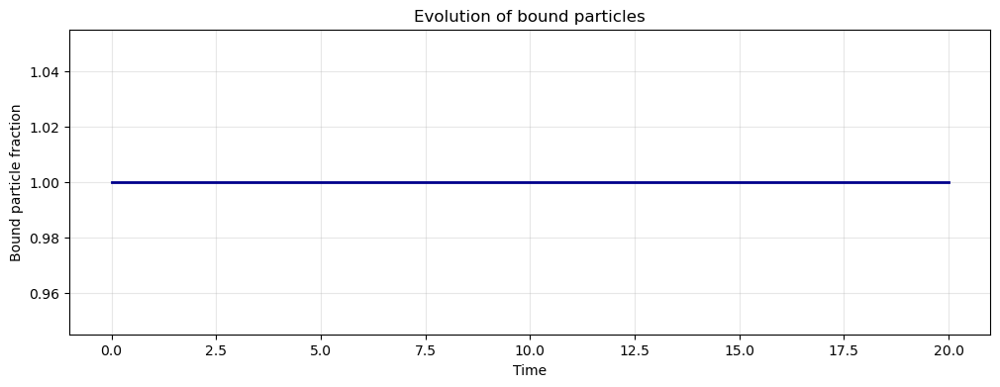

In [63]:
plot_bound_unbound_analysis(frames)

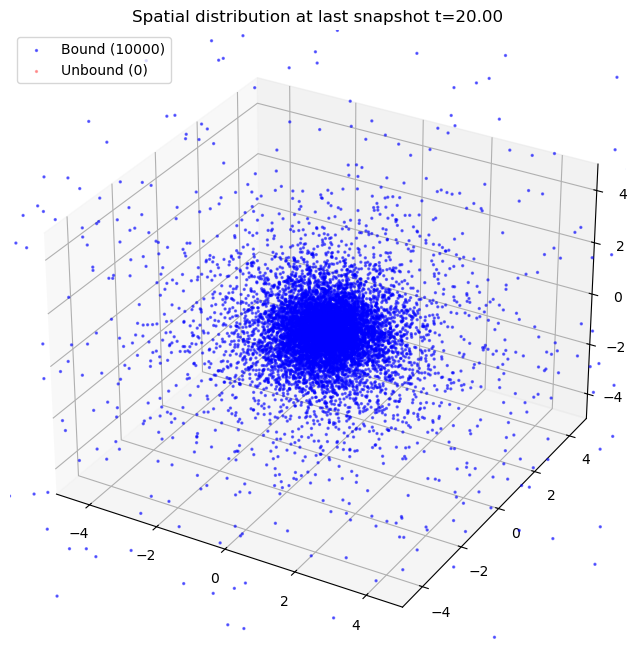

In [26]:
def plot_bound_vs_unbound_3d(snap, potential_array):
    pos = snap['pos']
    vel = snap['vel']
    m = snap['m']
    
    # Calcolo energia totale specifica
    ke = 0.5 * np.sum(vel**2, axis=1)
    te = ke + potential_array
    
    bound_mask = te < 0
    unbound_mask = te >= 0
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plottiamo le legate in blu (più piccole e dense)
    ax.scatter(pos[bound_mask, 0], pos[bound_mask, 1], pos[bound_mask, 2], 
               c='blue', s=2, alpha=0.5, label=f'Bound ({np.sum(bound_mask)})')
    
    # Plottiamo le non legate in rosso
    ax.scatter(pos[unbound_mask, 0], pos[unbound_mask, 1], pos[unbound_mask, 2], 
               c='red', s=2, alpha=0.3, label=f'Unbound ({np.sum(unbound_mask)})')
    
    ax.set_title(f"Spatial distribution at last snapshot t={snap['time']:.2f}")
    ax.set_xlim(-5,5)
    ax.set_ylim(-5,5)
    ax.set_zlim(-5,5)
    ax.legend()
    plt.show()
    return bound_mask, unbound_mask

# Esempio d'uso sull'ultimo snapshot
phi_last = compute_potential_numba(frames[-1]['pos'], frames[-1]['m'])
bound_mask, unbound_mask =plot_bound_vs_unbound_3d(frames[-1], phi_last)

# Animations

### Plummer Sphere Evolution

In [27]:
from matplotlib.animation import FuncAnimation

def animate_collapse(snapshots, R_limit=5.1):
    # Check if we actually have data
    if not snapshots:
        print("Error: No snapshots found. Check your parser.")
        return

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Initial data
    pos = snapshots[0]['pos']
    # 's' is point size. If N is large, keep s small (1 or 2)
    scat = ax.scatter(pos[:, 0], pos[:, 1], pos[:, 2], s=4, alpha=0.3)

    ax.set_xlim([-R_limit, R_limit])
    ax.set_ylim([-R_limit, R_limit])
    ax.set_zlim([-R_limit, R_limit])
    ax.set_title("Time: 0.00")

    def update(frame_idx):
        current_pos = snapshots[frame_idx]['pos']
        # For 3D, we must update using _offsets3d
        scat._offsets3d = (current_pos[:, 0], current_pos[:, 1], current_pos[:, 2])
        ax.set_title(f"Time: {snapshots[frame_idx]['time']:.3f}")
        return scat,

    # Increase interval if it's too fast, decrease if too slow
    ani = FuncAnimation(fig, update, frames=len(snapshots), interval=50, blit=False, repeat=True)
    
    return ani
    

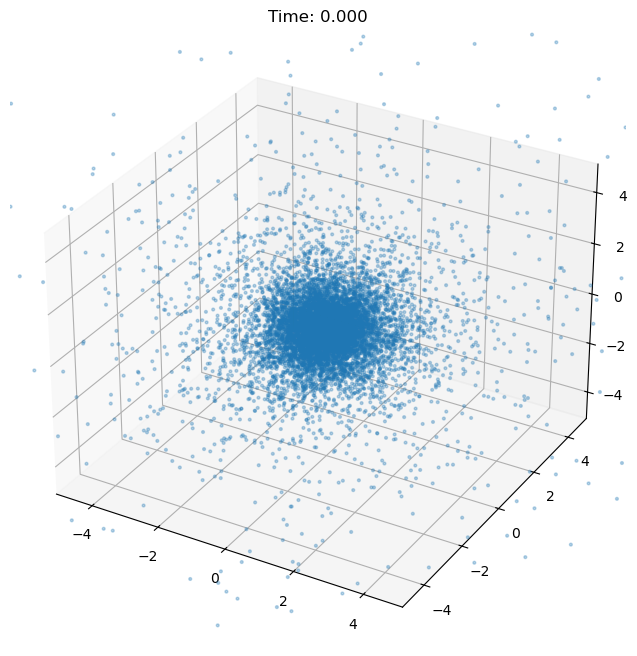

In [28]:
# Run it
#ani =animate_collapse(frames)
from IPython.display import HTML
# ... after creating 'ani' ...
# Use only every 2nd frame and every 2nd particle to reduce size by 4x
ani = animate_collapse(frames[::2])
HTML(ani.to_jshtml())

In [29]:
ani.save('Plummer.gif', writer='pillow');

### Initial and Final distributions of positions and velocities

In [30]:
v_in = (np.sqrt(frames[0]['vel'][:,0]**2+frames[0]['vel'][:,1]**2+frames[0]['vel'][:,2]**2))
v_fin = (np.sqrt(frames[-1]['vel'][:,0]**2+frames[-1]['vel'][:,1]**2+frames[-1]['vel'][:,2]**2))

psi_in = psi(np.sqrt(frames[0]['pos'][:,0]**2+frames[0]['pos'][:,1]**2+frames[0]['pos'][:,2]**2),1)
psi_fin = psi(np.sqrt(frames[-1]['pos'][:,0]**2+frames[-1]['pos'][:,1]**2+frames[-1]['pos'][:,2]**2),1)

q_in = v_in/np.sqrt(2*psi_in)
q_fin = v_fin/np.sqrt(2*psi_fin)

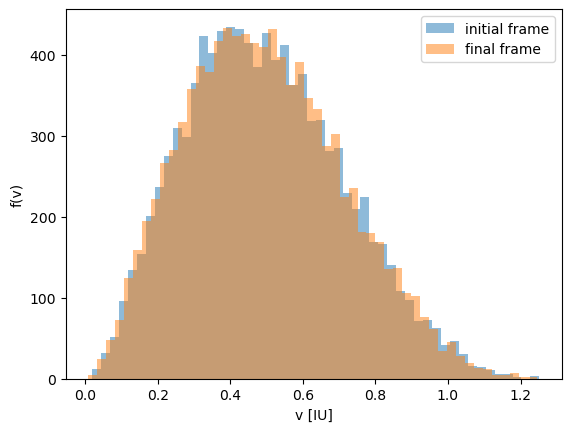

In [32]:
plt.hist(v_in,50,alpha=0.5,label='initial frame')
plt.hist(v_fin,50,alpha=0.5,label='final frame')
plt.legend()
plt.ylabel('f(v)')
plt.xlabel('v [IU]')
plt.plot();

In [56]:
print('mean at initial frame: %.3f, variance at initial frame 0: %.3f' % (np.mean(v_in), np.std(v_in)))
print('mean at final frame: %.3f, variance at final frame 0: %.3f' % (np.mean(v_fin), np.std(v_fin)))

mean at initial frame: 0.497, variance at initial frame 0: 0.216
mean at final frame: 0.496, variance at final frame 0: 0.216


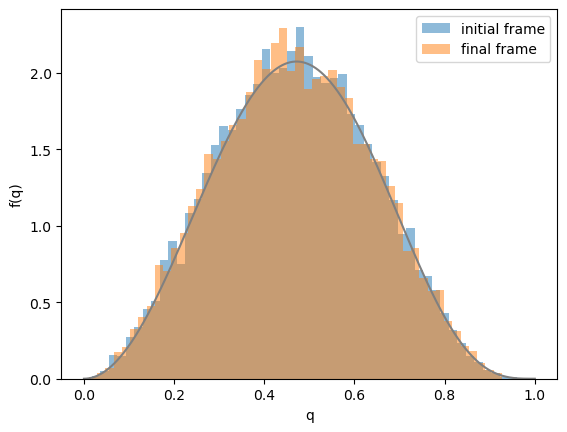

In [34]:
plt.hist(q_in,50,alpha=0.5,label='initial frame',density=True)
plt.hist(q_fin,50,alpha=0.5,label='final frame',density=True)
x = np.linspace(0,1,10000)
f = lambda x: (1-x**2)**(7/2)*x**2
plt.plot(x,22.5*f(x),c='grey')
plt.legend()
plt.ylabel('f(q)')
plt.xlabel('q')
plt.plot();

In [35]:
print('mean at initial frame: %.3f, variance at initial frame 0: %.3f' % (np.mean(q_in), np.var(q_in)))
print('mean at final frame: %.3f, variance at final frame 0: %.3f' % (np.mean(q_fin), np.var(q_fin)))

mean at initial frame: 0.468, variance at initial frame 0: 0.029
mean at final frame: 0.468, variance at final frame 0: 0.030


### Positions and Velocities Evolution

In [36]:
import functools
import matplotlib.animation as animation

In [37]:
def animate(frame_number, bar_container):

    vel = frames[frame_number]['vel']
    vel_v=np.sqrt(vel[:, 0]**2+vel[:, 1]**2+vel[:, 2]**2)

    pos = frames[frame_number]['pos']
    b=1.0
    r=np.sqrt(pos[:, 0]**2+pos[:, 1]**2+pos[:, 2]**2)
    vel_v=vel_v/np.sqrt(2*psi(r,b,phi0=0))

    x=np.linspace(0,1,10000)
    y=(1-x**2)**(7/2)*x**2
    plt.plot(x,22.5*y, c='b')
    
    n, _ = np.histogram(vel_v, 50, density=True)
    for count, rect in zip(n, bar_container.patches):
        rect.set_height(count)

    ax.set_title(f"Time: {frames[frame_number]['time']:.1f}")

    return bar_container.patches

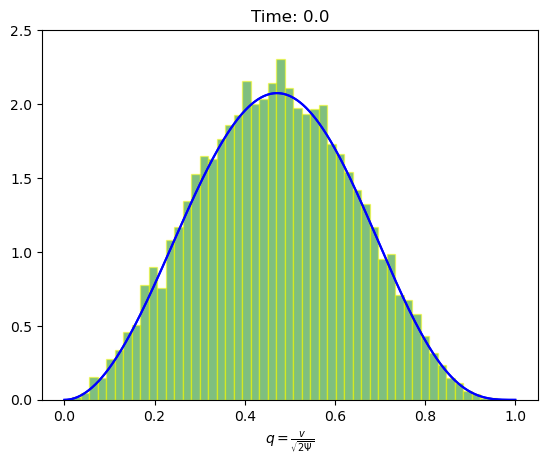

In [38]:
vel = frames[0]['vel']
vel_v=np.sqrt(vel[:, 0]**2+vel[:, 1]**2+vel[:, 2]**2)

pos = frames[0]['pos']
b=1.0
r=np.sqrt(pos[:, 0]**2+pos[:, 1]**2+pos[:, 2]**2)
vel_v=vel_v/np.sqrt(2*psi(r,b,phi0=0))


fig, ax = plt.subplots()
_, _, bar_container = ax.hist(vel_v, 50, lw=1,
                              ec="yellow", fc="green", alpha=0.5)
ax.set_ylim(top=2.5)  # set safe limit to ensure that all data is visible.
ax.set_title("Time: 0.00")
ax.set_xlabel(r'$q=\frac{v} { \sqrt{2 \Psi} }$')

anim = functools.partial(animate, bar_container=bar_container)
ani = animation.FuncAnimation(fig, anim, 41, repeat=False, blit=True)
plt.show()

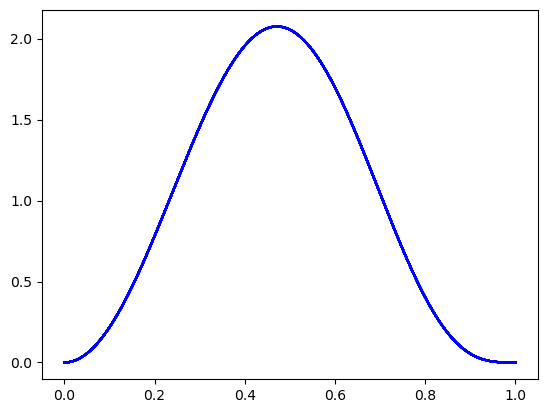

In [39]:
ani.save('v_Histogram.gif', writer='pillow');

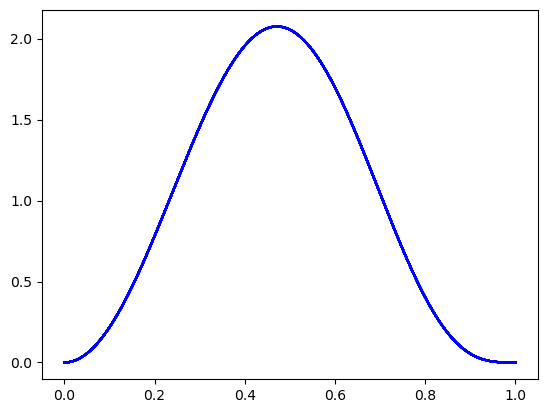

In [40]:
HTML(ani.to_jshtml())

In [41]:
def animate(frame_number, bar_container):

    pos = frames[frame_number]['pos']
    b=1.0
    r=np.sqrt(pos[:, 0]**2+pos[:, 1]**2+pos[:, 2]**2)
    
    n, _ = np.histogram(r, 50, range=(0,20), density=True)
    for count, rect in zip(n, bar_container.patches):
        rect.set_height(count)

    ax.set_title(f"Time: {frames[frame_number]['time']:.1f}")

    return bar_container.patches

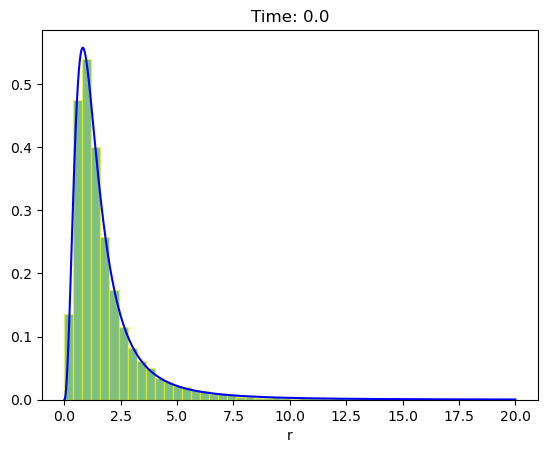

In [42]:
pos = frames[0]['pos']
b=1.0
r=np.sqrt(pos[:, 0]**2+pos[:, 1]**2+pos[:, 2]**2)

fig, ax = plt.subplots()
_, _, bar_container = ax.hist(r, bins=50, range=(0,20), lw=1,
                              ec="yellow", fc="green", alpha=0.5, density=True);

ax.set_title("Time: 0.00")
ax.set_xlabel("r")

x=np.linspace(0,20,10000)
y=3/(4*np.pi*b**2)*1/(1+(x/b)**2)**(5/2)*4*np.pi*x**2

ax.plot(x,y, c='b')

anim = functools.partial(animate, bar_container=bar_container)
ani = animation.FuncAnimation(fig, anim, 41, repeat=False, blit=True)
plt.show()

In [43]:
ani.save('r_Histogram.gif', writer='pillow');

In [44]:
HTML(ani.to_jshtml())

# Virial Ratio

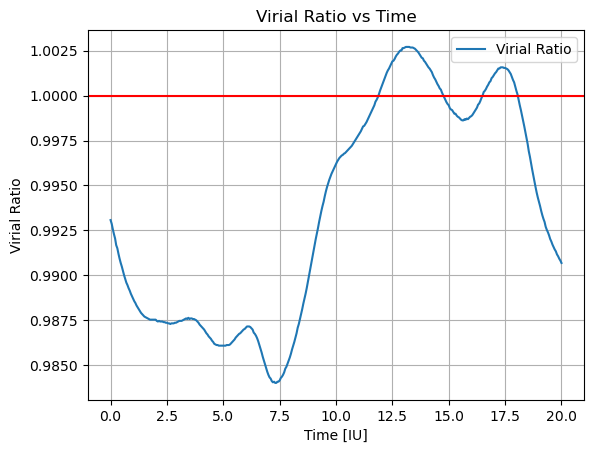

In [45]:
times = []
ke = []
pe = []

with open("logfile_Plummer2.txt", "r") as f:
    for line in f:
        columns = line.split()
        if len(columns) == 8 and columns[0].replace(".", "", 1).isdigit():
            times.append(float(columns[0]))
            ke.append(float(columns[2]))
            pe.append(float(columns[3]))
            

times = np.array(times)
ke = np.array(ke)
pe = np.array(pe)
virial = np.array(2*ke/pe)
peak_idx = np.argmax(virial)

virial_ratio = 2*ke / pe


plt.plot(times, virial_ratio, label='Virial Ratio')
plt.axhline(y=1, color='r', linestyle='-')
plt.xlabel("Time [IU]")
plt.ylabel("Virial Ratio")
plt.title("Virial Ratio vs Time")
plt.grid()
plt.legend()
plt.show()


# Orbits

In [46]:
def read_treecode_simulation(filename):

    times = []
    box_sizes = []
    data = []

    with open(filename, 'r') as f:

        while True:

            line = f.readline()

            if not line:
                break

            line = line.strip()

            if line == "":
                continue

            # -------------------------
            # numero particelle
            # -------------------------
            n_particles = int(line)

            # -------------------------
            # dimensione box
            # -------------------------
            box_size = float(f.readline().strip())
            box_sizes.append(box_size)

            # -------------------------
            # tempo
            # -------------------------
            t = float(f.readline().strip())
            times.append(t)

            # -------------------------
            # masse
            # -------------------------
            masses = []

            while len(masses) < n_particles:

                line = f.readline().strip()

                if line == "":
                    continue

                masses.extend(map(float, line.split()))

            masses = np.array(masses[:n_particles])

            # -------------------------
            # posizioni
            # -------------------------
            positions = []

            while len(positions) < n_particles:

                line = f.readline().strip()

                if line == "":
                    continue

                values = list(map(float, line.split()))

                for i in range(0, len(values), 3):
                    if i + 2 < len(values):
                        positions.append(values[i:i+3])

            positions = np.array(positions[:n_particles])

            # -------------------------
            # velocità
            # -------------------------
            velocities = []

            while len(velocities) < n_particles:

                line = f.readline().strip()

                if line == "":
                    continue

                values = list(map(float, line.split()))

                for i in range(0, len(values), 3):
                    if i + 2 < len(values):
                        velocities.append(values[i:i+3])

            velocities = np.array(velocities[:n_particles])

            # -------------------------
            # array finale:
            # [m, x, y, z, vx, vy, vz]
            # -------------------------
            particles = np.column_stack((
                masses,
                positions,
                velocities
            ))

            data.append(particles)

    return (
        np.array(times),
        np.array(box_sizes),
        np.array(data, dtype=object)
    )

In [47]:
t, _,data = read_treecode_simulation('out2.txt')

In [48]:
def plot_r(times, data, cm=None,
           title='Distance to the center over time'):

    # estrae posizioni
    positions = np.array([
        np.asarray(snapshot[:, 1:4], dtype=float)
        for snapshot in data
    ], dtype=float)

    # distanza dal centro
    r = np.linalg.norm(positions, axis=2)

    plt.figure(figsize=(12, 6))

    plt.plot(times, r, alpha=0.5)

    plt.title(title)
    plt.xlabel('t [IU]')
    plt.ylabel('r [IU]')

    if cm is not None:

        cm = np.asarray(cm, dtype=float)

        cm_r = np.linalg.norm(cm, axis=1)

        plt.plot(
            times,
            cm_r,
            color='black',
            linestyle='dashed',
            label='Center of mass'
        )

        plt.legend()
        #plt.yscale('log')

    plt.show()

In [49]:
def compute_cm(data):

    cm_list = []

    for snapshot in data:

        m = snapshot[:, 0]
        r = snapshot[:, 1:4]

        cm = np.sum(r * m[:, None], axis=0) / np.sum(m)

        cm_list.append(cm)

    return np.array(cm_list)

In [50]:
data.shape

(41, 10000, 7)

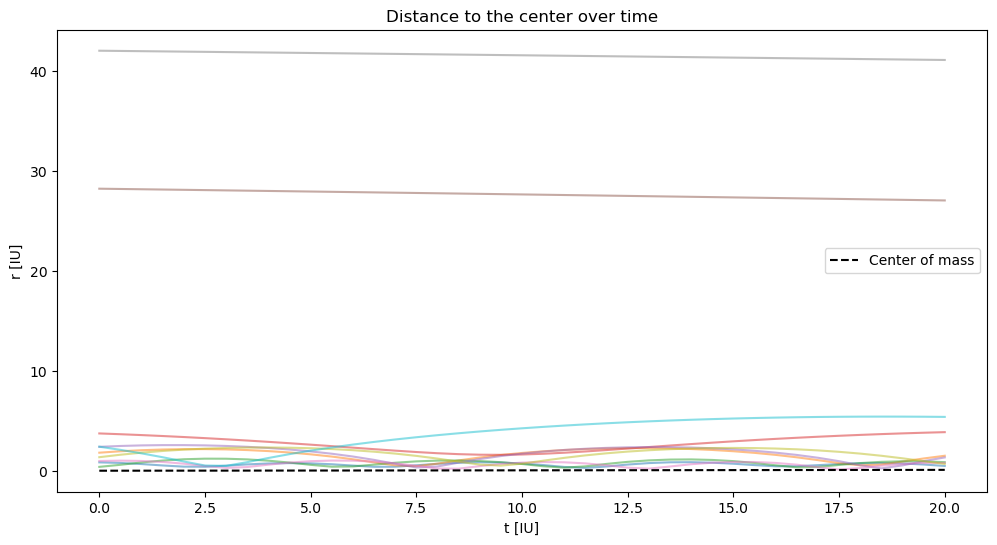

In [51]:
cm = compute_cm(data)

plot_r(t, data[:,::1000,:], cm=cm)

In [52]:
def plot_v(t, data, v_cm=None,
           title='Velocity over time'):

    # estrai velocità da ogni snapshot
    velocities = np.array([
        np.asarray(snapshot[:, 4:7], dtype=float)
        for snapshot in data
    ], dtype=float)

    # modulo velocità
    v_n = np.linalg.norm(velocities, axis=2)

    plt.figure(figsize=(12, 6))

    plt.plot(t, v_n, alpha=0.5)

    plt.title(title)
    plt.xlabel('t [IU]')
    plt.ylabel('v [IU]')

    plt.show()

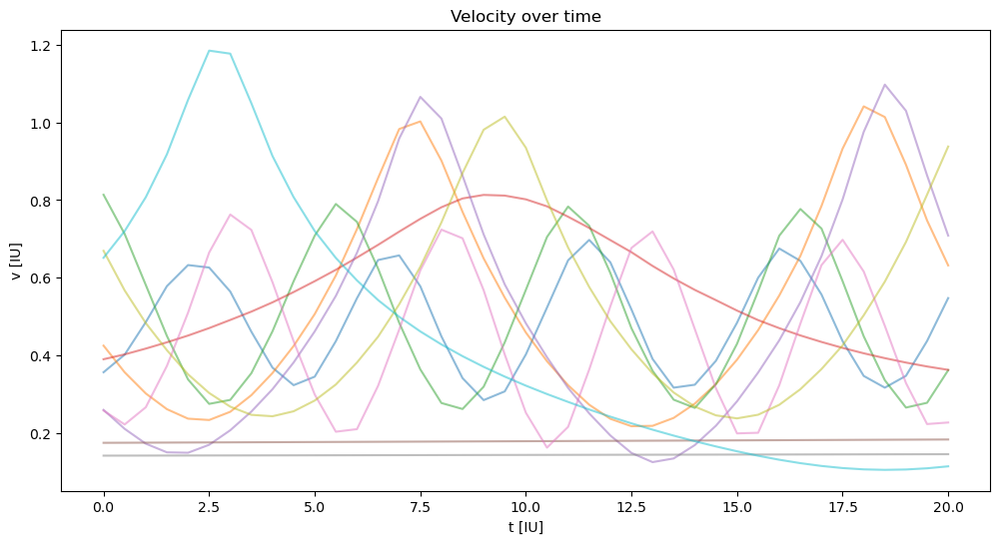

In [53]:
plot_v(t, data[:,::1000,:])